<table>
<tr>                                                                                   
     <th>
         <div style='padding:15px;color:#030aa7;font-size:240%;text-align: center;font-style: italic;font-weight: bold;font-family: Georgia, serif'><a href="https://www.kaggle.com/datasets/uciml/iris">Jeu de données Iris - Iris de Fisher ou Iris d'Anderson</a></div>
     </th>
     <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris.jpg" width="96"></th>
 </tr>
</table>

<table>
    <tr>                                                                                   
         <th  style="text-align:left;background-color:#053061;color:white;">Setosa</th>
         <th  style="text-align:left;background-color:#053061;color:white;">Virginica</th>
         <th  style="text-align:left;background-color:#053061;color:white;">Versicolor</th>
    </tr>
    <tr>
        <th  style="text-align:left"><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris_setosa.jpg" width="512"></th>
        <th  style="text-align:left"><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris_virginica.jpg" width="512"></th>
        <th  style="text-align:left"><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris_versicolor.jpg" width="512"></th>
    </tr>
</table>


<div style='padding:15px;color:#030aa7;font-size:100%;text-align: left;font-family: Georgia, serif'><a href="https://archive.ics.uci.edu/dataset/53/iris">Veuillez vous référer à la page UC Irvine Machine Learning Repository officielle pour plus de détails.</a></div>

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Introduction</div></b>
## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Import libriries </div></b>

In [1]:
import pandas as pd, numpy as np, seaborn as sns, warnings, os
from datetime import datetime as dt
from matplotlib import pyplot as plt

import matplotlib.font_manager as fm
import plotly.express as px
import plotly.graph_objs as go
import graphviz, pydotplus
from IPython.display import Image
import re

font1 = fm.FontProperties(size=20)
font2 = fm.FontProperties(size=24)

warnings.filterwarnings(action="ignore")

if int(str(sns.__version__).split('.')[1]) > 8 : 
    plt.style.use('seaborn-v0_8-darkgrid')
else:
    plt.style.use('seaborn-darkgrid')
sns.set(font_scale=3)

In [2]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from sklearn.tree import DecisionTreeClassifier,export_graphviz

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Outils du document</div></b>

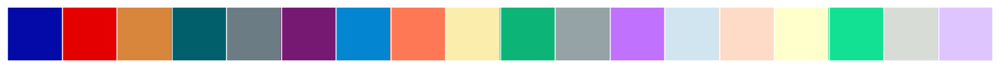

In [3]:
palette = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", 
            "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#c071fe", 
            "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#dfc5fe", 
          ]
sns.palplot(sns.color_palette(palette))

In [4]:
repertoireRacine  = '.'
nomProjet         = "Iris de Fisher ou d'Anderson-Analyse exploratoire des données"

repertoireProjet  = os.path.join(repertoireRacine, nomProjet)
repertoireDonnees = os.path.join(repertoireProjet, 'repertoire.donnees')
repertoireImages  = os.path.join(repertoireProjet, 'repertoire.images')


def controleExistenceRepertoire( repertoire, create_if_needed=True):
    """Voir si le répertoire existe. S'il n'existe pas il est créé."""
    path_exists = os.path.exists(repertoire)
    if path_exists:
        if not os.path.isdir(repertoire):
            raise Exception("Trouvé le nom  "+repertoire +" mais c'est un fichier, pas un répertoire")
            # return False
        return True
    if create_if_needed:
        os.makedirs(repertoire)

def sauvegarderImage( fichier):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    controleExistenceRepertoire(repertoireImages)
    plt.savefig(os.path.join(repertoireImages,
                             fichier+f"--{dt.now().strftime('%Y_%m_%d_%H.%M.%S')}.png"), 
                             dpi=600, 
                             bbox_inches='tight')

def sauvegarderImageSNS( sns_plot, fichier):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    controleExistenceRepertoire(repertoireImages)
    fig = sns_plot.get_figure()
    fig.savefig(os.path.join(repertoireImages,fichier+'.png'))
    
controleExistenceRepertoire(repertoireProjet);
controleExistenceRepertoire(repertoireDonnees);
controleExistenceRepertoire(repertoireImages);

In [5]:
def formatPct(pct, allvals):
    total = int(round(pct/100. * np.sum(allvals)))
    return "{:.2f}%\n({:d})".format(pct, total)    

In [6]:
def affichageDistribution(colonne,couleur,ax, nom=''):
    graph = sns.distplot(colonne, color=couleur, ax=ax)
    graph.set(ylabel=None)
    moyenne, mediane = float(colonne.mean()), \
                   float(colonne.median())
    
    ax.axvline(moyenne, color='g', linestyle='-', label=f"{nom:12s} mean   = {moyenne:0.4f}", lw=2)
    ax.axvline(mediane, color='b', linestyle='--', label=f"{nom:12s} median = {mediane:0.4f}", lw=2)
    graph.legend(loc="upper right")

In [7]:
def afficheDendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Classification Hiérarchique Ascendante')
        plt.xlabel('Villes ou (taille du cluster)')
        plt.ylabel('Distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Lecture des données</div></b>

<table>
    <tr> 
        <th  style="text-align:left">
            <table>
                <CAPTION style='padding:15px;color:#030aa7;font-size:150%;text-align: left;font-weight: bold;font-family: Georgia, serif'>Iris.csv</CAPTION>    
            <tr>                                                                                   
                <tr>                                                                                   
                     <th  style="text-align:left;background-color:#053061;color:white;">Colonne initiale </th>
                     <th  style="text-align:left;background-color:#053061;color:white;">Description</th>
                </tr>
                <tr>
                    <th  style="text-align:left">Id</th>
                    <th  style="text-align:left">Index</th>
                </tr>
                <tr>
                    <th  style="text-align:left">SepalLengthCm</th>
                    <th  style="text-align:left">Longueur du sépale en cm</th>
                </tr>
                <tr>
                    <th  style="text-align:left">SepalWidthCm</th>
                    <th  style="text-align:left">Largeur du sépale en cm</th>
                </tr>
                <tr>
                    <th  style="text-align:left">PetalLengthCm</th>
                    <th  style="text-align:left">Longueur du pétale en cm</th>
                </tr>
                <tr>
                    <th  style="text-align:left">PetalWidthCm</th>
                    <th  style="text-align:left">Largeur du pétale en cm</th>
                </tr>
                <tr>
                    <th  style="text-align:left;color:red;">Species</th>
                    <th  style="text-align:left;color:red;">Classe d'iris : Iris Setosa, Iris Versicolour ou Iris Virginica</th>
                </tr>
            </table>
        </th>
        <th  style="text-align:left"><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris_description.jpg" width="1024"></th>
    </tr>
</table>

In [8]:
donnees = pd.read_csv('../donnees/Iris.csv')
donnees.Species = donnees.Species.apply(lambda x : x.replace('Iris-',''))
donnees.columns = [colonne.replace('Cm','') if colonne != 'Species' else colonne for colonne in donnees.columns]
donnees.set_index('Id',inplace=True)
donnees.head()

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa


In [9]:
donnees.describe()

,SepalLength,SepalWidth,PetalLength,PetalWidth
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Espèces de iris</div></b>

In [10]:
donnees.Species.sort_values().unique()

array(['setosa', 'versicolor', 'virginica'], dtype=object)

In [11]:
dict_species = {nom:i for i, nom in enumerate(donnees.Species.sort_values().unique())}
dictR_species = {i:nom for i, nom in enumerate(donnees.Species.sort_values().unique())}
dict_species,dictR_species

({'setosa': 0, 'versicolor': 1, 'virginica': 2},
 {0: 'setosa', 1: 'versicolor', 2: 'virginica'})

In [12]:
donnees.Species = donnees.Species.apply(lambda x: dict_species[x])

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Statistiques descriptives et analyse de données</div></b>

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Couleurs variables qualitatives</div></b>

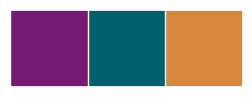

In [13]:
couleursEspece = {nom:couleur for nom,couleur in zip(donnees.Species.sort_values().unique(),["#751973","#005f6a","#d8863b"])}
couleursEspeceNom = {dictR_species[num]:couleursEspece[num] for num in couleursEspece}
sns.palplot(sns.color_palette(couleursEspece.values()))

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Statistiques  descriptives</div></b>

In [14]:
donnees.sample(5)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
121,6.9,3.2,5.7,2.3,2
148,6.5,3.0,5.2,2.0,2
1,5.1,3.5,1.4,0.2,0
138,6.4,3.1,5.5,1.8,2
69,6.2,2.2,4.5,1.5,1


In [15]:
donnees.describe().style.format("{:0.2f}") #.background_gradient(cmap=plt.get_cmap('Blues'),axis=0)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
count,150.00,150.00,150.00,150.00,150.00
mean,5.84,3.05,3.76,1.20,1.00
std,0.83,0.43,1.76,0.76,0.82
min,4.30,2.00,1.00,0.10,0.00
25%,5.10,2.80,1.60,0.30,0.00
50%,5.80,3.00,4.35,1.30,1.00
75%,6.40,3.30,5.10,1.80,2.00
max,7.90,4.40,6.90,2.50,2.00


In [16]:
donnees.columns

Index(['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth', 'Species'], dtype='object')

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Structure de l’échantillon des données </div></b>

In [17]:
donnees.sample(5)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
65,5.6,2.9,3.6,1.3,1
50,5.0,3.3,1.4,0.2,0
132,7.9,3.8,6.4,2.0,2
87,6.7,3.1,4.7,1.5,1
21,5.4,3.4,1.7,0.2,0


In [18]:
donnees.groupby(['Species']).SepalLength.count().reset_index()

,Species,SepalLength
0,0,50
1,1,50
2,2,50


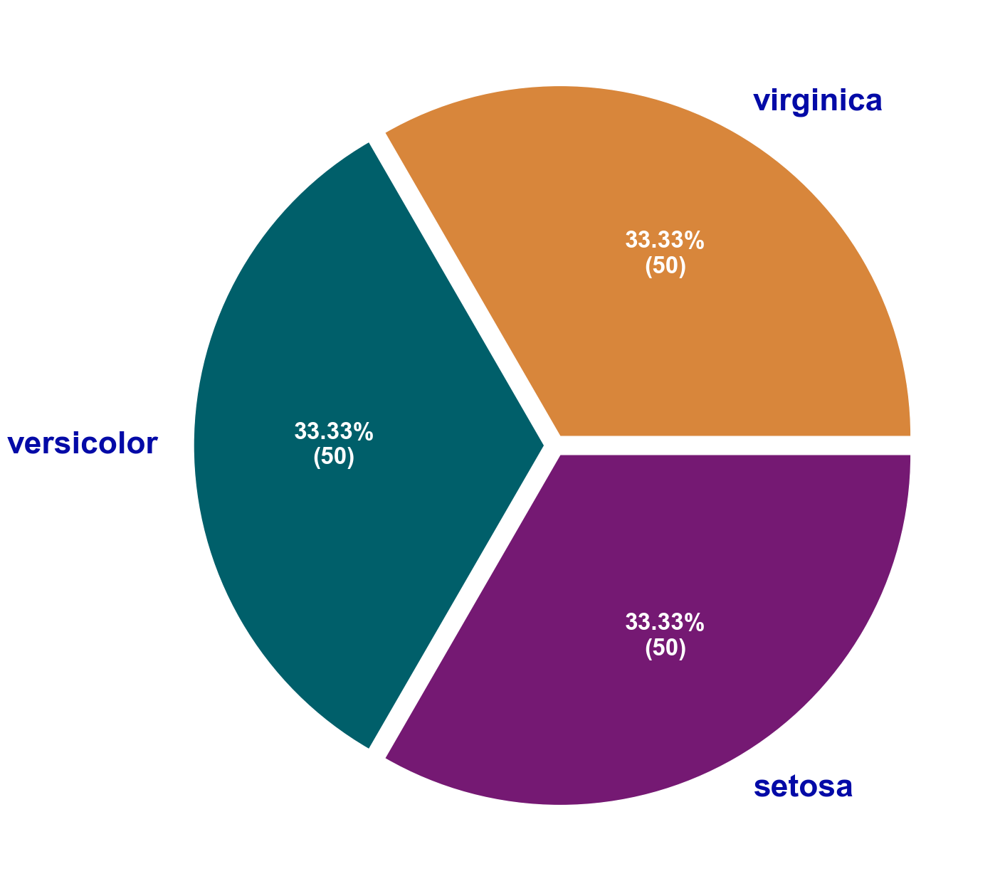

In [19]:
radius,size=0.8,0.3
fig,ax = plt.subplots(ncols=1,figsize=(16,16), subplot_kw=dict(aspect="equal"))

affichage = donnees.groupby(['Species']).SepalLength.count().reset_index().rename(columns={'SepalLength':'nombre'})
affichage['%'] = affichage.nombre * 100 / affichage.nombre.sum()
affichage

wedges, texts, autotexts =  ax.pie(
         affichage['nombre'],
         autopct=lambda pct: formatPct(pct, affichage.nombre.values),   # autopct='%1.2f%%', 
         labels=affichage['Species'].apply(lambda x : dictR_species[x]).values,
         # shadow=True, 
         counterclock=False,
         startangle=0 ,
         colors = couleursEspece.values(),
         # pctdistance=0.4, 
         labeldistance=1.1, 
         textprops=dict(color="#030aa7"),
         explode=(0.03,0.03,0.03)
      );
plt.setp(autotexts, size=24, weight="bold",color="w")
plt.setp(texts, size=32, weight="bold");

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Distribution de l’échantillon des données </div></b>

In [20]:
donnees.sample(5)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
54,5.5,2.3,4.0,1.3,1
128,6.1,3.0,4.9,1.8,2
96,5.7,3.0,4.2,1.2,1
36,5.0,3.2,1.2,0.2,0
33,5.2,4.1,1.5,0.1,0


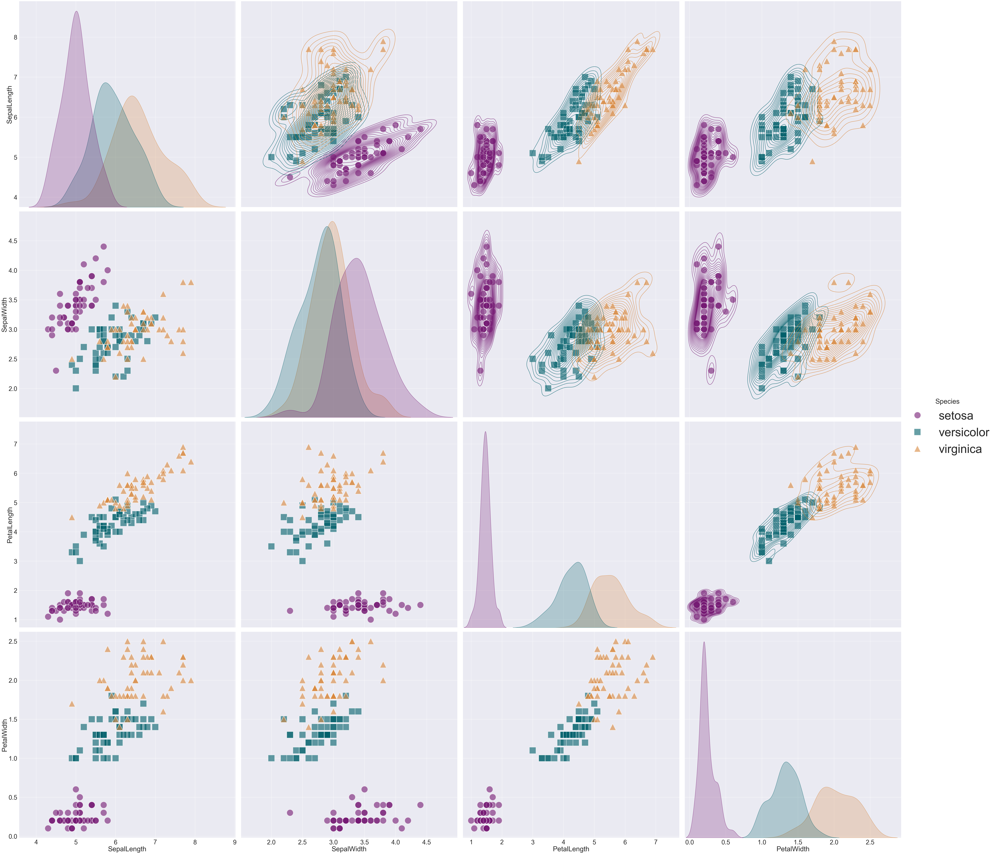

In [21]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])

graph = sns.pairplot(
             affichage,
             hue='Species', 
             size=16, 
             aspect=1, 
             palette=couleursEspece.values(), 
             plot_kws={"s": 1200,"alpha":0.6}, 
             markers=["o", "s", "^"],   
             # corner=True, 
             diag_kind="kde")
graph.map_upper(sns.kdeplot, levels=24, color=".2");
graph._legend.remove()
graph.add_legend(fontsize='xx-large', title_fontsize='xx-large');
del affichage
sauvegarderImage('Iris-pairplot')

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Corrélation de Pearson</div></b>

<table>        
<tr>                                                                                   
     <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/rmse.png" ></th>
     <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/rse.png" ><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/correlation_pearson.png" ></th>
</tr> 
</table>
<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/correlation_pearson_graphs.png" width="1024">

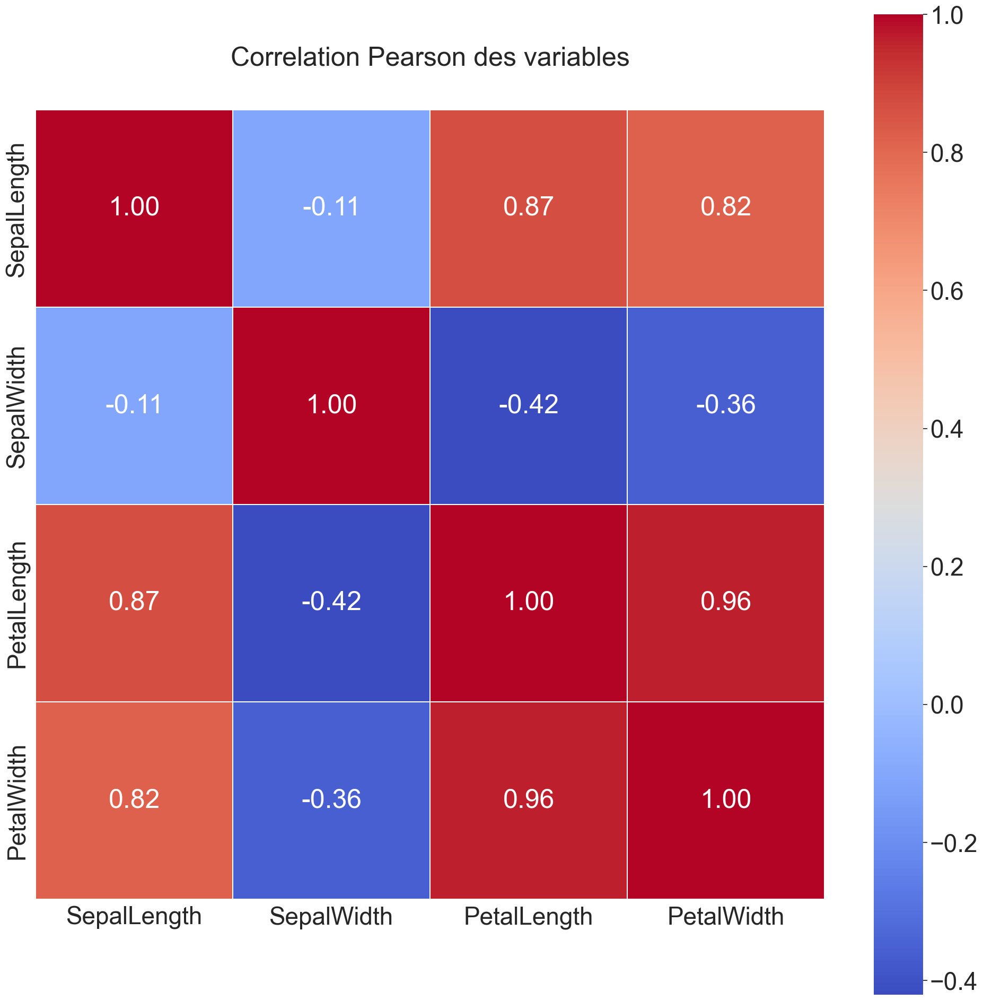

In [22]:
plt.figure(figsize=(24,24))
sns.set(font_scale=3)
plt.title('Correlation Pearson des variables', y=1.05, size=36)
sns.heatmap(donnees.drop(columns='Species').corr(),linewidths=0.3, fmt= '.2f', #vmax=1.0, 
            square=True, cmap='coolwarm', linecolor='white', annot=True)
sauvegarderImage('Correlation Pearson des variables')   
sns.set(font_scale=2)

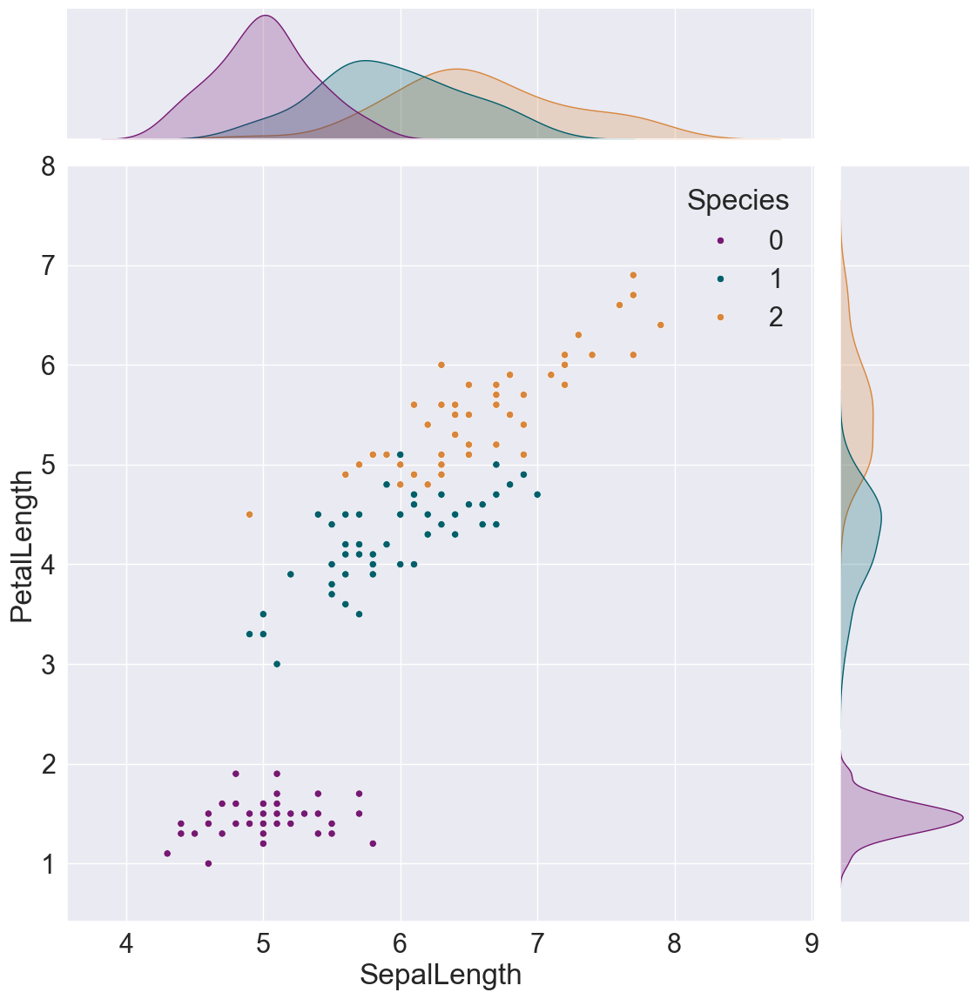

In [23]:
sns.jointplot(data=donnees, x="SepalLength", y="PetalLength",hue='Species',height=12, ratio=5, palette=list(couleursEspece.values()))
sauvegarderImage('Correlation Pearson des variables-SepalLength-PetalLength')   

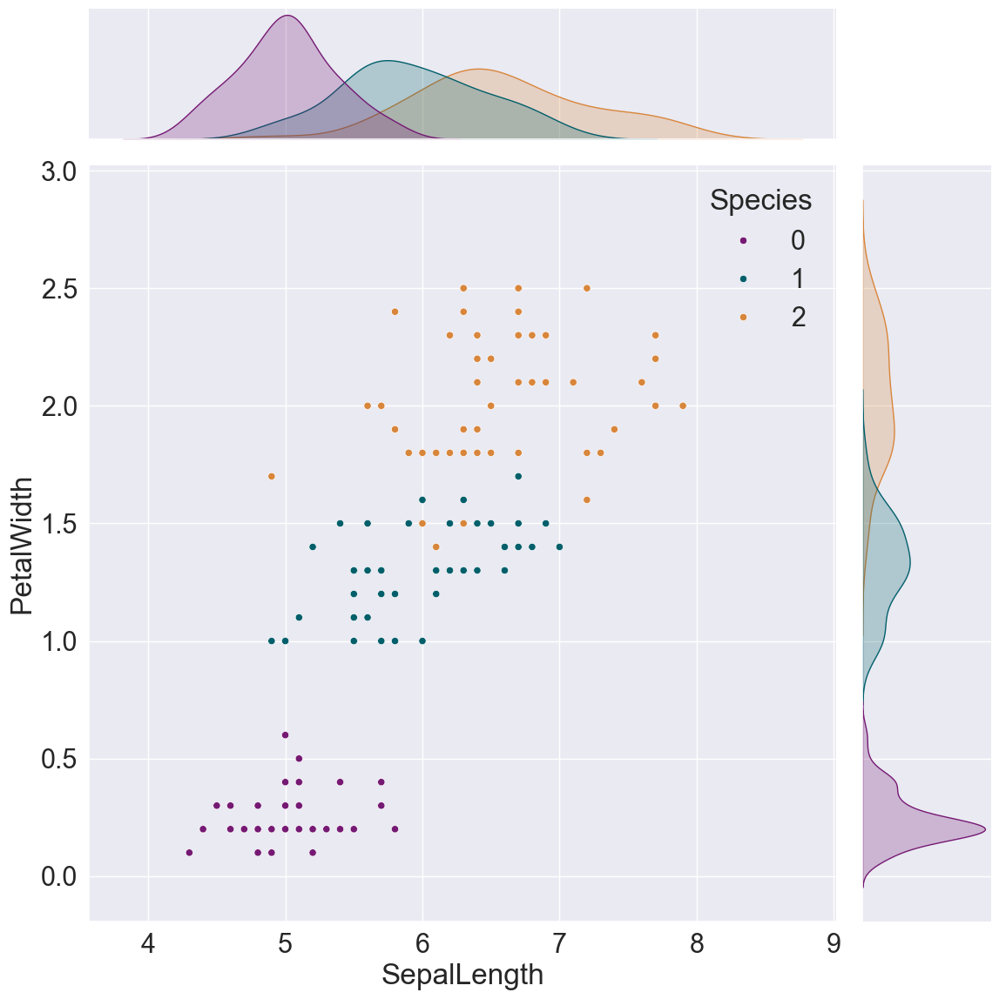

In [24]:
sns.jointplot(data=donnees, x="SepalLength", y="PetalWidth",hue='Species',height=12, ratio=5, palette=list(couleursEspece.values()))
sauvegarderImage('Correlation Pearson des variables-SepalLength-PetalWidth')   

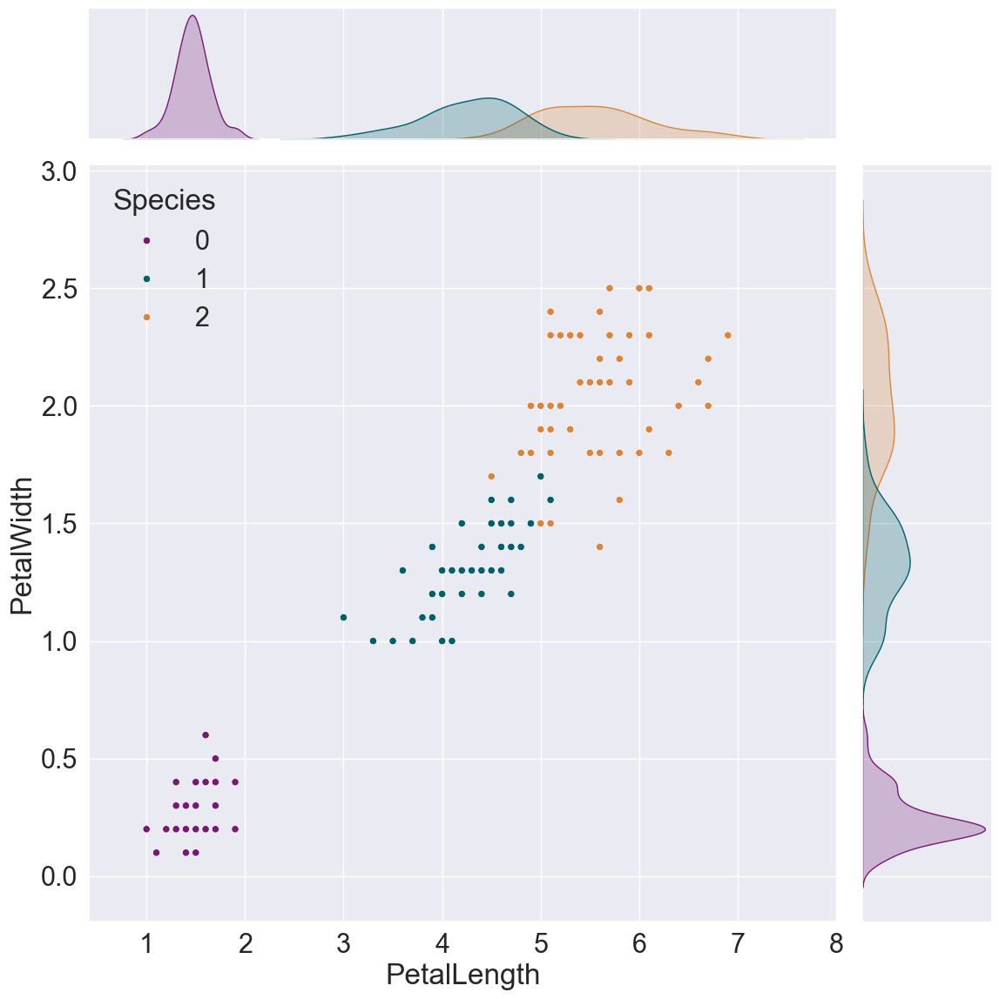

In [25]:
sns.jointplot(data=donnees, x="PetalLength", y="PetalWidth",hue='Species',height=12, ratio=5, palette=list(couleursEspece.values()))
sauvegarderImage('Correlation Pearson des variables-PetalLength-PetalWidth')   

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Distribution des variables</div></b>

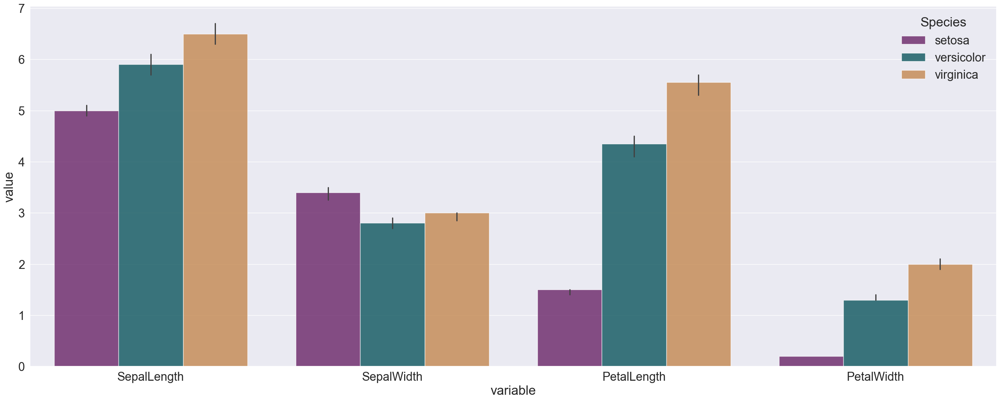

In [26]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])
affichage = affichage.melt(id_vars=['Species'], value_vars=['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth'])

plt.figure(figsize=(32,12))
gbarplot = sns.barplot(x='variable',y='value',hue='Species', data=affichage,palette=couleursEspece.values(),alpha=0.8,estimator='median')
sauvegarderImage('Moyenne des variables initiales par espèce-barplot')   

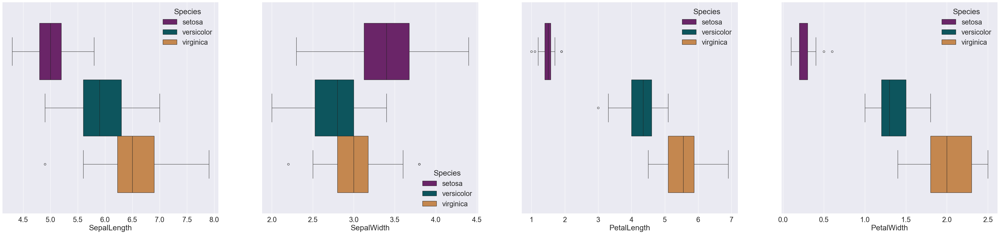

In [27]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])

fig,ax = plt.subplots(1,4,figsize=(56,12));

for i,colonne in enumerate(affichage.columns[:-1]):
    sns.boxplot(x=colonne,data=affichage,hue='Species', palette=couleursEspece.values(), ax=ax[i]);
    
sauvegarderImage('Distribution des variables initiales par espèce-boxplot')       

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Centrage et réduction des données</div></b>
<table>
<tr>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/moyenne.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/ecart_type.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/centrage_reduction.png"></th>
</tr>
</table>

In [28]:
modelStd = StandardScaler()
modelStd.fit(donnees.drop(columns='Species'))

donnees[donnees.drop(columns='Species').columns] = modelStd.transform(donnees.drop(columns='Species'))
donnees.drop(columns='Species').head()

,SepalLength,SepalWidth,PetalLength,PetalWidth
Id,,,,
1,-0.900681,1.032057,-1.341272,-1.312977
2,-1.143017,-0.124958,-1.341272,-1.312977
3,-1.385353,0.337848,-1.398138,-1.312977
4,-1.506521,0.106445,-1.284407,-1.312977
5,-1.021849,1.263460,-1.341272,-1.312977


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Distribution variables quantitatives</div></b>

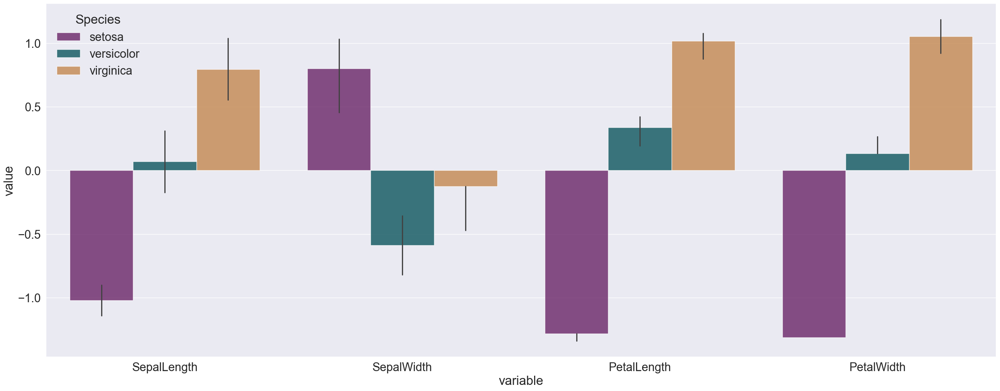

In [29]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])
affichage = affichage.melt(id_vars=['Species'], value_vars=['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth'])

plt.figure(figsize=(32,12))
gbarplot = sns.barplot(x='variable',y='value',hue='Species', data=affichage,palette=couleursEspece.values(),alpha=0.8,estimator='median')
sauvegarderImage('Moyenne des variables centrées et réduites par espèce-barplot') 

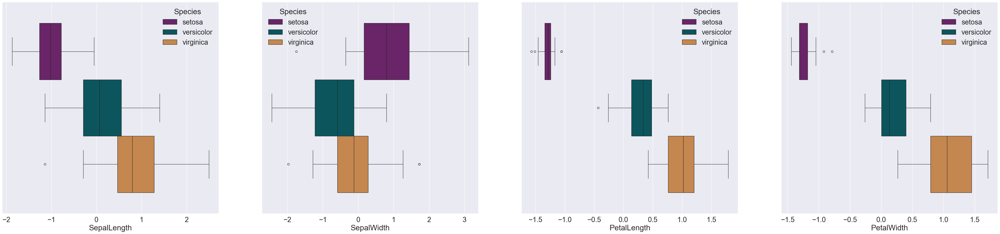

In [30]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])

fig,ax = plt.subplots(1,4,figsize=(56,12));

for i,colonne in enumerate(affichage.columns[:-1]):
    sns.boxplot(x=colonne,data=affichage,hue='Species', palette=couleursEspece.values(), ax=ax[i]);

sauvegarderImage('Distribution des variables centrées et réduites par espèce-boxplot')      

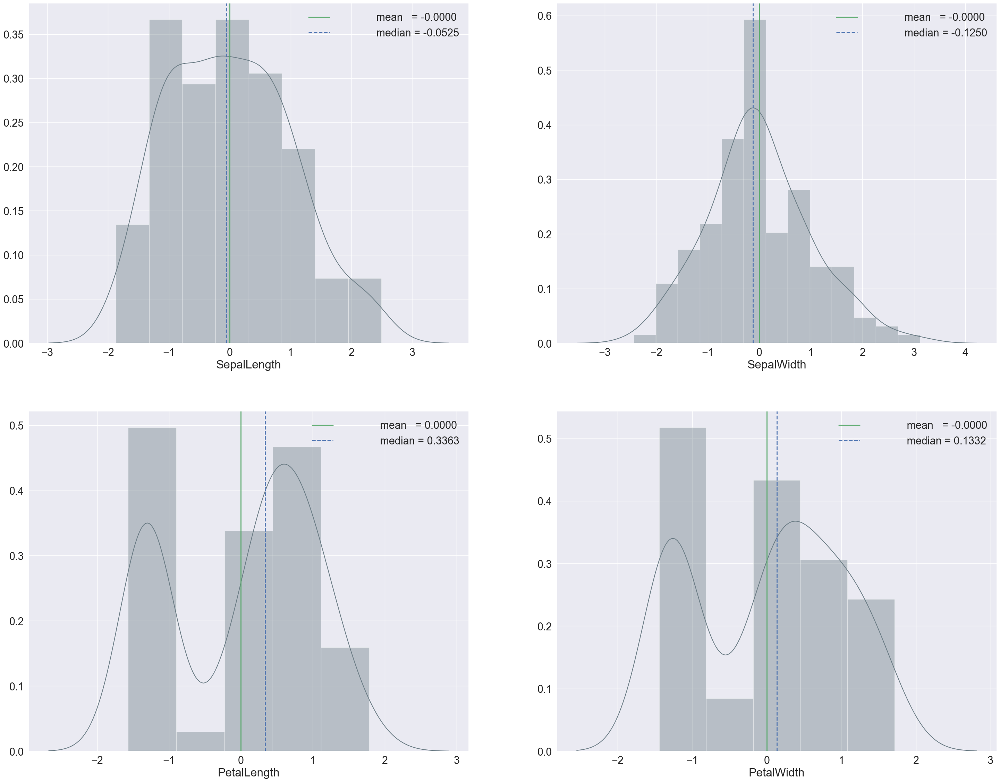

In [31]:
fig, axes = plt.subplots(2,2, figsize=(36,28));
for ax,colonne in zip(axes.ravel(),affichage.columns[:-1]):
    affichageDistribution(affichage[colonne],"#6b7c85",ax)
sauvegarderImage('Distribution Variables Quantitatives')

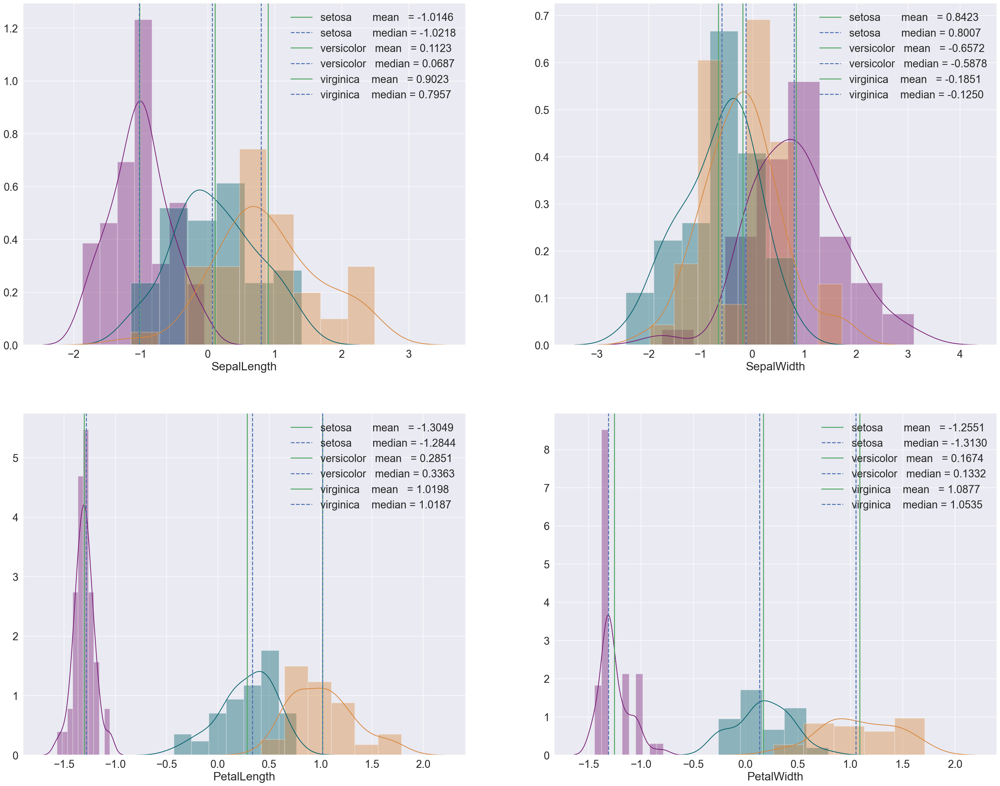

In [32]:
fig, axes = plt.subplots(2,2, figsize=(36,28));
for ax,colonne in zip(axes.ravel(),affichage.columns[:-1]):
    affichageDistribution(affichage.loc[affichage.Species == 'setosa',colonne],'#751973',ax,nom='setosa')
    affichageDistribution(affichage.loc[affichage.Species == 'versicolor',colonne],'#005f6a',ax,nom='versicolor')
    affichageDistribution(affichage.loc[affichage.Species == 'virginica',colonne],'#d8863b',ax,nom='virginica') 
sauvegarderImage('Distribution Variables Quantitatives-par espèce')